# Lab 1.2 Analysis
** Jason Chou **
<br>
- Goal: Combine calibration images and coadd calibrated science images to produce a colored image

In [69]:
%%capture
## ignore warnings...

## autoreload scripts
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/")

import coaddition
import pyfits
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import calibration as cp
from matplotlib.colors import LogNorm
import glob
import os
%matplotlib inline

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['axes.labelsize'] = 40
plt.rcParams['xtick.labelsize'] = 40
plt.rcParams['ytick.labelsize'] = 40

In [65]:
## Other stuff
exec(open(predir+'/chto_coadd.py'))
exec(open(predir+'/Jason/Lab1.2/batch.py'))
from IPython.core.display import Image, display

---
## Data - M51 Archival
This time I will perform the tasks on the M51 images, which are prettier (and contain more features!) than M81...

In [9]:
datadir = '/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/'
predir  = '/afs/ir.stanford.edu/class/physics100/workdir/g2'

In [8]:
M51_R_list = np.asarray(pd.read_csv(datadir+'/R/fitsfiles.list',header=None))[:,0]
M51_G_list = np.asarray(pd.read_csv(datadir+'/G/fitsfiles.list',header=None))[:,0]
M51_B_list = np.asarray(pd.read_csv(datadir+'/B/fitsfiles.list',header=None))[:,0]

The calibration master images were generated by Chun-hao in Lab 1.1

In [11]:
bias_frame   = pyfits.open(predir+"/chto/Lab1.2/M51_Bias.fits")[0].data
dark_frame   = pyfits.open(predir+"/chto/Lab1.2/M51_Master_Dark.fits")[0].data
flat_frame_R = pyfits.open(predir+"/chto/Lab1.2/M51_Master_Flat_R.fits")[0].data
flat_frame_G = pyfits.open(predir+"/chto/Lab1.2/M51_Master_Flat_G.fits")[0].data
flat_frame_B = pyfits.open(predir+"/chto/Lab1.2/M51_Master_Flat_B.fits")[0].data

### Calibrate the science images

In [14]:
%%capture
## will overwrite existing calibrated files
M51_cln_R = cp.batchScienceExposure(M51_R_list, bias_frame, dark_frame, flat_frame_R, outDir=datadir+"R/")
M51_cln_G = cp.batchScienceExposure(M51_G_list, bias_frame, dark_frame, flat_frame_G, outDir=datadir+"G/")
M51_cln_B = cp.batchScienceExposure(M51_B_list, bias_frame, dark_frame, flat_frame_B, outDir=datadir+"B/")

Display some exaggerated contrast

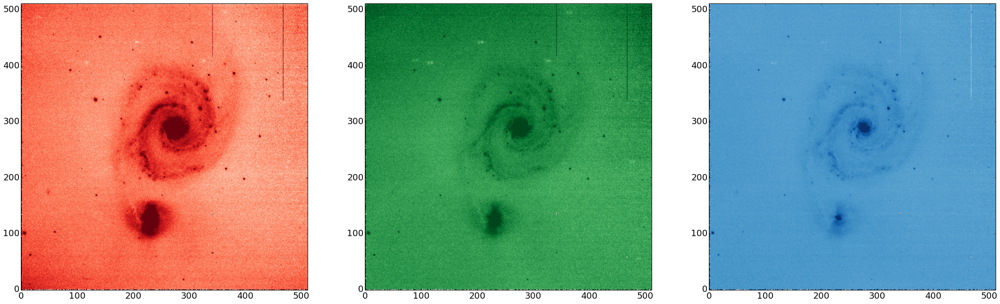

In [26]:
plt.figure(figsize=(36,24))
plt.subplot(131)
plt.imshow(M51_cln_R[0], origin='lower', cmap='Reds',norm=LogNorm()); plt.clim(7e2,1e3)
plt.subplot(132)
plt.imshow(M51_cln_G[0], origin='lower', cmap='Greens',norm=LogNorm()); plt.clim(1e3,1.5e3)
plt.subplot(133)
plt.imshow(M51_cln_B[0], origin='lower', cmap='Blues',norm=LogNorm()); plt.clim(3e2,1e3)

---
## Coaddition

We will setup the common paths for the final products:

_For individual steps, see below in `Supplementary Stuff`_

In [66]:
%%capture
M51_coadd_R = RunCoadd("R", datadir)
M51_coadd_G = RunCoadd("G", datadir)
M51_coadd_B = RunCoadd("B", datadir)

Should I delete it?y
Should I delete it?y
Should I delete it?y


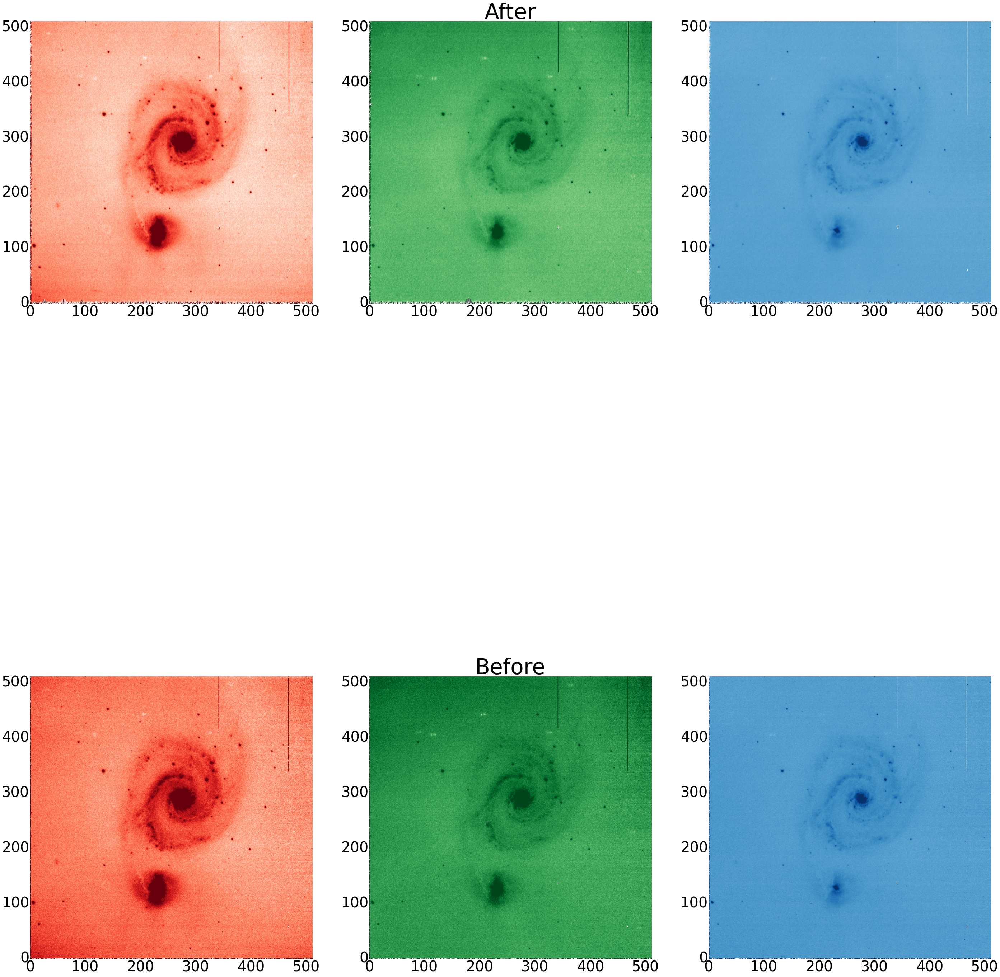

In [70]:
plt.figure(figsize=(48,60))
plt.subplot(231)
plt.imshow(M51_coadd_R, origin='lower', cmap='Reds',norm=LogNorm()); plt.clim(7e2,1e3)
plt.subplot(232); plt.title('After')
plt.imshow(M51_coadd_G, origin='lower', cmap='Greens',norm=LogNorm()); plt.clim(1e3,1.5e3)
plt.subplot(233)
plt.imshow(M51_coadd_B, origin='lower', cmap='Blues',norm=LogNorm()); plt.clim(3e2,1e3)

plt.subplot(234)
plt.imshow(M51_cln_R[0], origin='lower', cmap='Reds',norm=LogNorm()); plt.clim(7e2,1e3)
plt.subplot(235); plt.title('Before')
plt.imshow(M51_cln_G[0], origin='lower', cmap='Greens',norm=LogNorm()); plt.clim(1e3,1.5e3)
plt.subplot(236)
plt.imshow(M51_cln_B[0], origin='lower', cmap='Blues',norm=LogNorm()); plt.clim(3e2,1e3)

### Difference
Well, it is not clear how they are "improved". Let us plot the "differences", and in gray scale

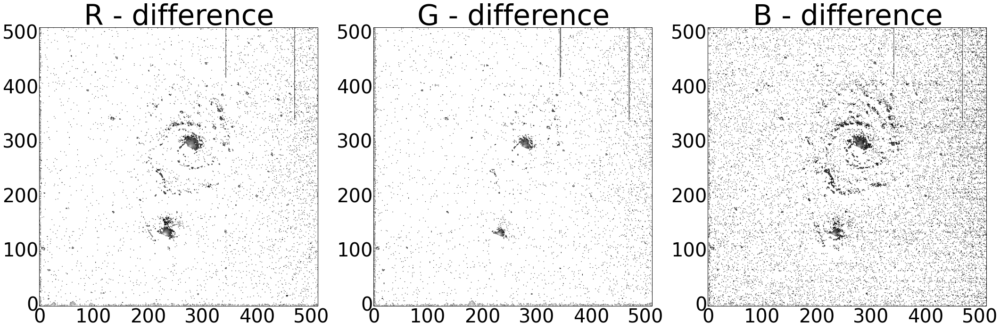

In [82]:
plt.figure(figsize=(36,24))
plt.subplot(131); plt.title('R - difference')
plt.imshow(M51_coadd_R-M51_cln_R[0], origin='lower', cmap='gray',norm=LogNorm()); plt.clim(1e1,1e4)
plt.subplot(132); plt.title('G - difference')
plt.imshow(M51_coadd_G-M51_cln_G[0], origin='lower', cmap='gray',norm=LogNorm()); plt.clim(1e1,1e4)
plt.subplot(133); plt.title('B - difference')
plt.imshow(M51_coadd_B-M51_cln_B[0], origin='lower', cmap='gray',norm=LogNorm()); plt.clim(1e1,1e4)

Apparently most things (calibration) are done with the "noisy backgrounds" (here white where the difference is large), and the stars and the galaxy roughly remain intact (black means ~< 1/100 of peak intensity).

### Colored Image

In [85]:
M51_fin_Rdir = datadir+"{0}/coadd/coadd.fits".format("R")
M51_fin_Gdir = datadir+"{0}/coadd/coadd.fits".format("G")
M51_fin_Bdir = datadir+"{0}/coadd/coadd.fits".format("B")

Now plot with `STIFF`

In [89]:
os.system("/afs/ir.stanford.edu/class/physics100/stiff/bin/stiff {0} {1} {2} -OUTFILE_NAME M51_colored.tiff".format(M51_fin_Rdir,M51_fin_Gdir,M51_fin_Bdir))
os.system("mv M51_colored.tiff {0}/Jason/Lab1.2/".format(predir))

0

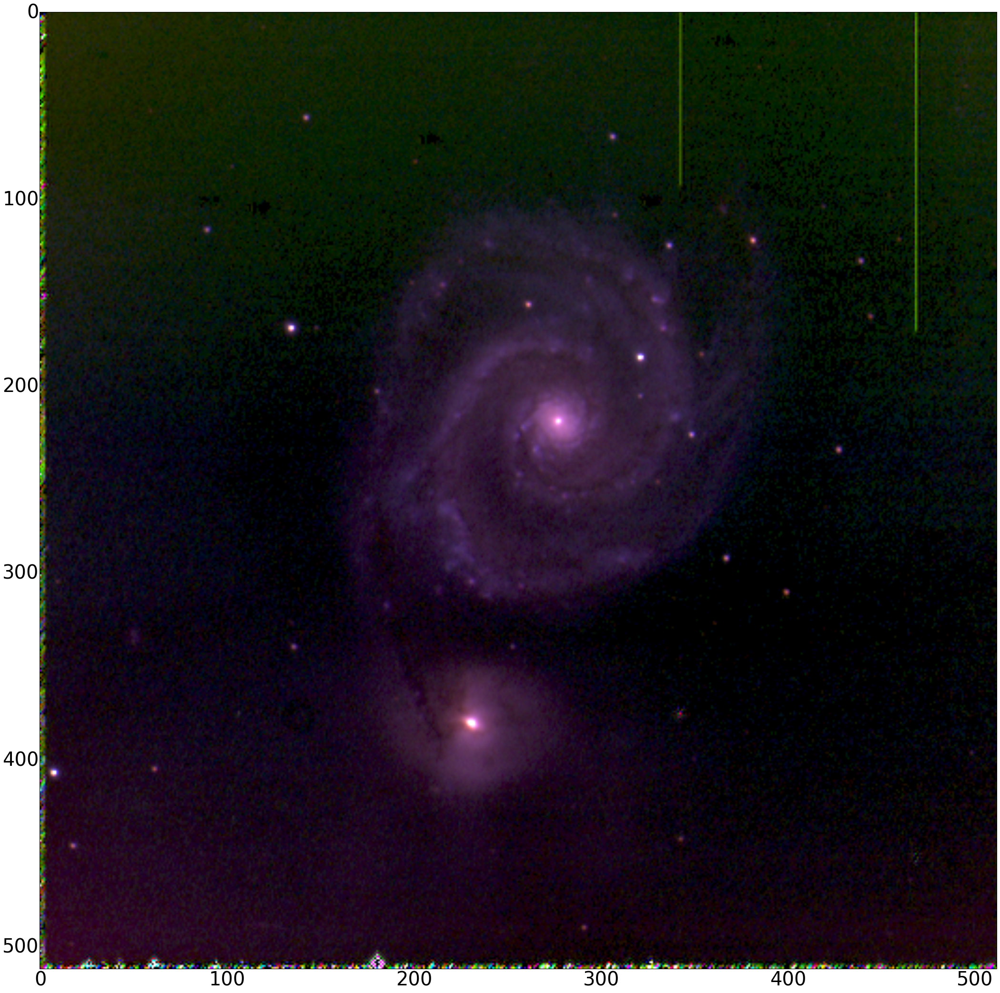

In [91]:
from IPython.core.display import Image, display
from PIL import Image

plt.figure(figsize=(36,36))
plt.imshow(Image.open("{0}/Jason/Lab1.2/M51_colored.tiff".format(predir)))

# _AWESOME!_

---
## Supplementary Stuff</font>
Below exemplifies the whole process on the Red-filtered science image, stored in a separate test directory.

In [29]:
coaddDir = predir+'/Jason/Lab1.2/test/coadd'
refDir   = predir+'/Jason/Lab1.2/test/reference.cat'

#### Set up the paths for calibrated science images

In [30]:
processedImage=[file for file in glob.glob("/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/R/*") if "Processed" in file]
processedImage

['/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/R/Processed_M51_001R.fit',
 '/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/R/Processed_M51_002R.fit',
 '/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/R/Processed_M51_003R.fit',
 '/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/R/Processed_M51_004R.fit',
 '/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/R/Processed_M51_005R.fit',
 '/afs/ir.stanford.edu/class/physics100/workdir/g2/M51/R/Processed_M51_006R.fit']

In [31]:
coaddition.setupWorkdir(processedImage,coaddDir)

I have found 6 images to align.
Your workdir already exists. 
(workdir = /afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd)
Should I delete it?y
Ok, starting from scratch.
Database written. See you !


#### Find suitable reference stars

In [32]:
coaddition.detectStars(coaddDir)

Reading database...
I will now start to run sextractor on these 6 images.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
1 / 6 : Processed_M51_001R.fit
Processed_M51_001R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
2 / 6 : Processed_M51_002R.fit
Processed_M51_002R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
3 / 6 : Processed_M51_003R.fit
Processed_M51_003R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
4 / 6 : Processed_M51_004R.fit
Processed_M51_004R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
5 / 6 : Processed_M51_005R.fit
Processed_M51_005R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
6 / 6 : Processed_M51_006R.fit
Processed_M51_006R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
I'me done. It took me 0:00:00
Datab

#### How is the seeing of each of  them?

Importing matplotlib...
Reading database...
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
1 / 6 : Processed_M51_001R.fit
Number of sources in catalog : 89
I've read 22 usable stars from Processed_M51_001R.cat
2
Stellar FWHM [pixels] : 1.35
I found 12 stars for ellipticity measure.
Measured ellipticity : 0.0945
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
2 / 6 : Processed_M51_002R.fit
Number of sources in catalog : 86
I've read 24 usable stars from Processed_M51_002R.cat
2
Stellar FWHM [pixels] : 1.35
I found 14 stars for ellipticity measure.
Measured ellipticity : 0.09
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
3 / 6 : Processed_M51_003R.fit
Number of sources in catalog : 55
I've read 24 usable stars from Processed_M51_003R.cat
2
Stellar FWHM [pixels] : 1.55
I found 12 stars for ellipticity measure.
Measured ellipticity : 0.0785
- - - - - - - - - - - - - - - - - - - - - - - - -

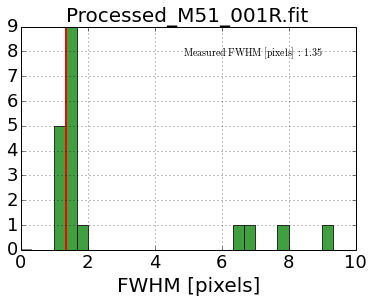

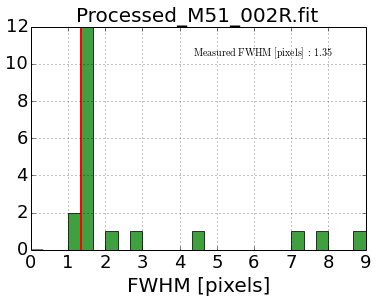

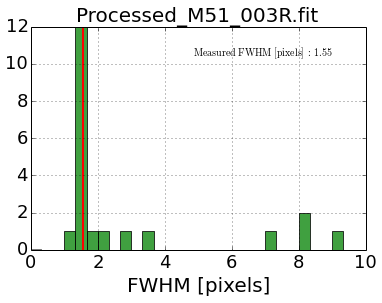

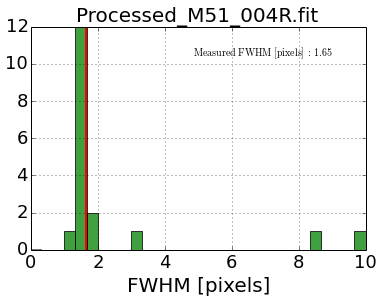

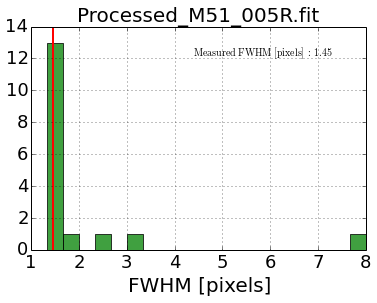

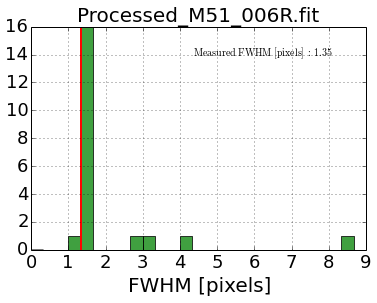

In [33]:
coaddition.measureSeeing(coaddDir, showseeingplots=True)

#### Construct reference catalog

In [34]:
coaddition.createRefCatalog(coaddDir, outputcatpath = refDir)

Reading database...
Ok, we have 6 images.
Automatic reference image selection
Reference image catalog : Processed_M51_006R.cat
So you want me to select alignment stars. Fine, let's see what we can do.
Number of sources in catalog : 58
I've read 24 usable stars from Processed_M51_006R.cat
Parameters minfwhm = 1.000000, maxfwhm = 8.500000, maxell = 1.250000
I've selected the 21 brightest stars among 21 available good stars.
        24 : (  321.84,  327.82) |     42526.80 |  4.03  0.32
        40 : (    7.97,  105.20) |     37781.80 |  1.43  0.10
        15 : (  134.85,  343.03) |     30154.60 |  1.46  0.07
        13 : (  261.81,  355.65) |     14791.10 |  1.43  0.06
        53 : (  381.96,  390.01) |     14497.30 |  1.52  0.12
        21 : (  348.94,  286.07) |     10051.60 |  1.49  0.09
        18 : (  321.55,  306.87) |      8389.65 |  2.81  0.12
        32 : (  231.41,  207.79) |      7500.01 |  3.32  0.20
        29 : (  312.23,  219.93) |      7265.71 |  8.36  0.13
        54 : (  

#### Visualize the reference stars

In [44]:
visualizeAlignmentStars(coaddDir)

Reading database...
Ok, we have 6 images.
Reading alignment star catalog...
Automatic reference image selection :
Processed_M51_006R.fit
Input shape : (512, 512)
Input file BITPIX : -32
Internal array type : float32
Image is too small for a border of 300
Sky level at 736.801270 +/- 43.645237
Setting auto z1 to 605.865559, nsig = 3
Setting auto z2 to 3696.144043
Rebinning 3x3 : I have to crop from [512 512] to [510 510]
Cropping : [0:510, 0:510]
PIL range : [0, 255]
PIL image made with scale : log
Switching to RGB !
I've drawn 21 stars.
I've written some info on the image.
I've written a title on the image.
Writing image to /afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/alistars_refimage.png...
170 x 170 pixels, mode RGB
Done.
Now have a look at :
/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/alistars_refimage.png
... and decide if you are happy with this selection.


_(Something strange happened here. I couldn't get the code run before I forced all the array "indices" to be `integers`. Usually I only got a warning of "... this will be deprecated ...". Anyway, I had to modify and implement our own `f2n.py`. Maybe the TA's can fix this though it seems to be problematic for me only...)_

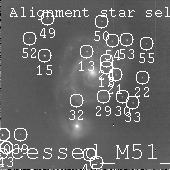

In [49]:
display(Image(coaddDir+'/alistars_refimage.png', width=500))

#### Real coaddition starts here...

In [46]:
coaddition.matchAlignmentStars(coaddDir, refcat=refDir)

Reading database...
Ok, we have 6 images.
Reading alignment star catalog...
Automatic reference image selection :
Processed_M51_006R.fit
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
1 / 6 : Processed_M51_001R.fit
scalingratio : 1.0
Number of sources in catalog : 89
I've read 22 usable stars from Processed_M51_001R.cat
Keeping 22 stars among 22.
Number of tries : 11
distdiff : 0.271832195279
rotcandangle : 0.119388298729
Star pairs used :
        24 : (  321.84,  327.82) |     42526.80 |  4.03  0.32
        15 : (  134.85,  343.03) |     30154.60 |  1.46  0.07
        39 : (  320.30,  324.29) |     41088.10 |  1.36  0.17
        36 : (  133.60,  339.88) |     29438.00 |  1.40  0.08
Identified stars : 15 / 21
Transformation found.
No match for star 40
No match for star 18
No match for star 32
No match for star 29
No match for star 45
No match for star 48
Comment : No match : 40 18 32 29 45 48 
Writing geomap input file with 15 stars.
Done.
- - - - - - 

True

#### Transformation rules for all images based on the matching above

In [47]:
coaddition.createTransforms(coaddDir)


OK, now let's pyraf !
Reading database...
Ok, we have 6 images ready for alignment.
images/:
 imcoords/      imfit/          immatch/        tv/
 imfilter/      imgeom/         imutil/
Size of reference image : (512, 512)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
1 / 6 : Processed_M51_001R.fit
Scale : 0.9999243
Angle : 359.99084
RMS   : 0.0763580357767
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
2 / 6 : Processed_M51_002R.fit
Scale : 1.00001
Angle : 359.99606
RMS   : 0.108588199251
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
3 / 6 : Processed_M51_003R.fit
Scale : 0.9999609
Angle : 359.99991
RMS   : 0.112111517399
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
4 / 6 : Processed_M51_004R.fit
Scale : 0.999921
Angle : 359.99139
RMS   : 0.118622378306
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
5 / 6 : Proces

#### Transform...

In [48]:
coaddition.transformImages(coaddDir)

Reading database...
Ok, we have 6 images ready to be transformed.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
1 / 6 : Processed_M51_001R.fit
Overwrite existing file '/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/Processed_M51_001R_ali.fits'.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
2 / 6 : Processed_M51_002R.fit
Overwrite existing file '/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/Processed_M51_002R_ali.fits'.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
3 / 6 : Processed_M51_003R.fit
Overwrite existing file '/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/Processed_M51_003R_ali.fits'.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
4 / 6 : Processed_M51_004R.fit
Overwrite existing file '/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/Proc

#### Also for the masks (if any)
In our case, though we do not really have masks, they are needed for subsequent processing...

In [51]:
coaddition.transformMasks(coaddDir, maskext='.mask')

Reading database...
Ok, we have 6 images ready for mask transformation.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
1 / 6 : Processed_M51_001R.fit
1
3
/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coaddarea.fits
4
Overwrite existing file '/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/Processed_M51_001R_mask.fits'.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
2 / 6 : Processed_M51_002R.fit
1
3
/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coaddarea.fits
4
Overwrite existing file '/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coadd/Processed_M51_002R_mask.fits'.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
3 / 6 : Processed_M51_003R.fit
1
3
/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/Lab1.2/test/coaddarea.fits
4
Overwrite existing file '/afs/ir.stanford.edu/class/physics100/workdir

#### Combine (coadd) the transformed images

In [52]:
coaddition.coaddImages(coaddDir, coaddfile = None, method='median')

Reading database...
Ok, we have 6 images to combine.

Apr 18 22:19: IMCOMBINE
  combine = median, scale = none, zero = none, weight = none
  blank = 0.
  masktype = goodval, maskval = 0
                Images  Maskfile
  Processed_M51_001R_ali.fits Processed_M51_001R_mask.fits
  Processed_M51_002R_ali.fits Processed_M51_002R_mask.fits
  Processed_M51_003R_ali.fits Processed_M51_003R_mask.fits
  Processed_M51_004R_ali.fits Processed_M51_004R_mask.fits
  Processed_M51_005R_ali.fits Processed_M51_005R_mask.fits
  Processed_M51_006R_ali.fits

  Output image = coadd.fits, ncombine = 6
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Dear user, I'm done with the alignment. I did it in 0:00:00.


---
#### Done
Take a look:

In [54]:
M51_coadd_R = pyfits.open(coaddDir+"/coadd.fits")[0].data

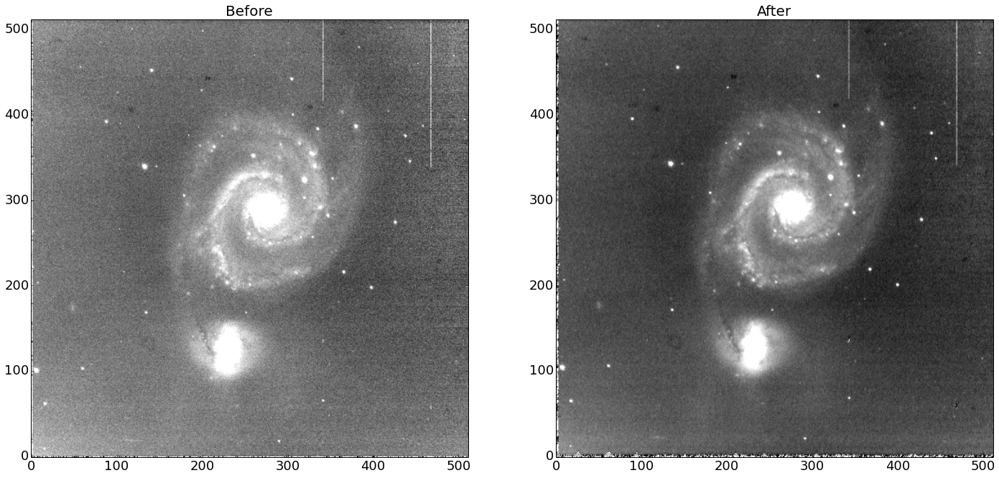

In [57]:
plt.figure(figsize=(24,12))
plt.subplot(121); plt.title('Before')
plt.imshow(M51_cln_R[0], origin='lower', norm=LogNorm(), cmap="gray"); plt.clim(7e2,1e3)
plt.subplot(122); plt.title('After')
plt.imshow(M51_coadd_R, origin='lower', norm=LogNorm(), cmap="gray"); plt.clim(7e2,1e3)

Okay, apart from the "background" noises, the features remain conspicuous, and the seeing does not get worse (due to presumed imperfectness of... everything), which is great. But the transformations do introduce artifacts near the edges.